In [7]:
import os
import cv2

# Define the path to your dataset directory on your Mac desktop
desktop_path = os.path.expanduser("~/Desktop/Deep_Learning")
dataset_path = os.path.join(desktop_path, "Handwriting_Dataset")

# Define the target size for resizing
target_width = 128
target_height = 128

# Create a directory for the resized images
resized_path = os.path.join(desktop_path, "Resized_Images")
os.makedirs(resized_path, exist_ok=True)

# Loop through each main folder ("Capital," "Small," "Number")
for folder in os.listdir(dataset_path):
    folder_path = os.path.join(dataset_path, folder)
    
    if os.path.isdir(folder_path):  # Check if it's a directory
        # Create a directory for the resized images for this folder
        folder_resized_path = os.path.join(resized_path, folder)
        os.makedirs(folder_resized_path, exist_ok=True)
        
        # Loop through each character or digit folder within the main folder
        for character_folder in os.listdir(folder_path):
            character_folder_path = os.path.join(folder_path, character_folder)
            
            if os.path.isdir(character_folder_path):  # Check if it's a directory
                # Create a directory for the resized images for this character or digit
                character_resized_path = os.path.join(folder_resized_path, character_folder)
                os.makedirs(character_resized_path, exist_ok=True)
                
                # Loop through each image in the character or digit folder
                for filename in os.listdir(character_folder_path):
                    image_path = os.path.join(character_folder_path, filename)
                    
                    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if it's an image file
                        # Read the image
                        image = cv2.imread(image_path)
                        
                        if image is not None and not image.size == 0:  # Check if it's a valid image
                            # Resize the image while maintaining the aspect ratio
                            resized_image = cv2.resize(image, (target_width, target_height))
                            
                            # Save the resized image
                            resized_image_path = os.path.join(character_resized_path, filename)
                            cv2.imwrite(resized_image_path, resized_image)

print("Image resizing and preprocessing complete.")


Image resizing and preprocessing complete.


In [8]:
#Data Augmentation and Data Addition

import os
import cv2
import numpy as np

# Define the path to your resized images directory
resized_images_path = os.path.expanduser("~/Desktop/Deep_Learning/Resized_Images")

# Function for adding Gaussian noise to an image
def add_gaussian_noise(image, mean=0, sigma=25):
    row, col, ch = image.shape
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = np.clip(image + gauss, 0, 255)noisy = cv2.Sobel(noisy, cv2.CV_64F, 1, 0, ksize=3)
    # Apply the Sobel operator for edge detection to the noisy image
    noisy = cv2.Sobel(noisy, cv2.CV_64F, 1, 0, ksize=3)
    return noisy.astype(np.uint8)

def apply_binarization(image, threshold=128):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return binary_image

# Function for applying shearing to an image
def apply_shearing(image, shear_factor=0.2):
    rows, cols, ch = image.shape  # Define rows and cols
    shear_matrix = np.array([[1, shear_factor, 0], [0, 1, 0]], dtype=np.float32)
    sheared_image = cv2.warpAffine(image, shear_matrix, (cols, rows), borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255))
    return sheared_image

# Loop through each main folder ("Capital," "Small," "Number")
for main_folder in os.listdir(resized_images_path):
    main_folder_path = os.path.join(resized_images_path, main_folder)
    
    if os.path.isdir(main_folder_path):  # Check if it's a directory (main folder)
        # Loop through each character folder within the main folder
        for character_folder in os.listdir(main_folder_path):
            character_folder_path = os.path.join(main_folder_path, character_folder)
            
            if os.path.isdir(character_folder_path):  # Check if it's a directory (character folder)
                # Loop through each image in the character folder
                for filename in os.listdir(character_folder_path):
                    image_path = os.path.join(character_folder_path, filename)
                    
                    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if it's an image file
                        # Read the image
                        image = cv2.imread(image_path)
                        
                        grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                        if grayscale_image is not None and not grayscale_image.size == 0:  # Check if it's a valid image
                            # Apply binarization
                            binary_image = apply_binarization(grayscale_image)

                            # Save the binarized image
                            binarized_image_path = os.path.join(character_folder_path, f"binarized_{filename}")
                            cv2.imwrite(binarized_image_path, binary_image)
                        
                        if image is not None and not image.size == 0:  # Check if it's a valid image
                            rows, cols, ch = image.shape  # Define rows and cols
                            # Apply data augmentation (rotation, scaling, brightness/contrast adjustment, blurring, shearing, and noise) to resized images
                            for angle in [-10, 10]:  # Apply rotations of -10 and 10 degrees
                                rotated_image_counterclockwise = cv2.getRotationMatrix2D((cols / 2, rows / 2), -angle, 1)
                                rotated_image_clockwise = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)

                                rotated_image_counterclockwise = cv2.warpAffine(image, rotated_image_counterclockwise, (cols, rows))
                                rotated_image_clockwise = cv2.warpAffine(image, rotated_image_clockwise, (cols, rows))
    
                                rotated_image_path_counterclockwise = os.path.join(character_folder_path, f"rotated_{-angle}_{filename}")
                                rotated_image_path_clockwise = os.path.join(character_folder_path, f"rotated_{angle}_{filename}")
                                
                                cv2.imwrite(rotated_image_path_counterclockwise, rotated_image_counterclockwise)
                                cv2.imwrite(rotated_image_path_clockwise, rotated_image_clockwise)
                            for scale_factor in [0.9, 1.1]:  # Apply scaling factors of 0.9 and 1.1
                                scaled_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor)
                                scaled_image_path = os.path.join(character_folder_path, f"scaled_{scale_factor}_{filename}")
                                cv2.imwrite(scaled_image_path, scaled_image)
                            # Adjust brightness and contrast
                            brightness = 50  # Change as needed
                            contrast = 1.5  # Change as needed
                            adjusted_image = cv2.convertScaleAbs(image, alpha=contrast, beta=brightness)
                            adjusted_image_path = os.path.join(character_folder_path, f"brightness_contrast_{filename}")
                            cv2.imwrite(adjusted_image_path, adjusted_image)
                            # Apply blurring
                            for kernel_size in [3, 5]:  # Use different kernel sizes
                                blurred_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
                                blurred_image_path = os.path.join(character_folder_path, f"blurred_{kernel_size}_{filename}")
                                cv2.imwrite(blurred_image_path, blurred_image)
                            # Apply shearing
                            sheared_image = apply_shearing(image)
                            sheared_image_path = os.path.join(character_folder_path, f"sheared_{filename}")
                            cv2.imwrite(sheared_image_path, sheared_image)
                            # Apply Gaussian noise to resized images
                            noisy_image = add_gaussian_noise(image)
                            noisy_image_path = os.path.join(character_folder_path, f"noisy_{filename}")
                            cv2.imwrite(noisy_image_path, noisy_image)

print("Data augmentation of resized images complete.")
print("Image binarization complete.")

Data augmentation of resized images complete.
Image binarization complete.


In [9]:
import os
import shutil
import random

# Define the paths for your data
data_path = os.path.expanduser("~/Desktop/Deep_Learning/Resized_Images")
base_train_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Train")
base_val_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Validate")
base_test_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Test")

# Define the data splitting ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# List of categories (Capital, Small, Number)
categories = ["Capital", "Small", "Number"]

# Create the same folder structure as in Resized_Images
for split_path in [base_train_path, base_val_path, base_test_path]:
    for category in categories:
        src_category_path = os.path.join(data_path, category)
        dest_category_path = os.path.join(split_path, category)
        os.makedirs(dest_category_path, exist_ok=True)

        for character_folder in os.listdir(src_category_path):
            if os.path.isdir(os.path.join(src_category_path, character_folder)):
                dest_character_folder_path = os.path.join(dest_category_path, character_folder)
                os.makedirs(dest_character_folder_path, exist_ok=True)

# Loop through each category (Capital, Small, Number)
for category in categories:
    src_category_path = os.path.join(data_path, category)

    if os.path.isdir(src_category_path):
        # Loop through each character folder within the category
        for character_folder in os.listdir(src_category_path):
            character_folder_path = os.path.join(src_category_path, character_folder)

            if os.path.isdir(character_folder_path):  # Check if it's a directory (character folder)
                images = os.listdir(character_folder_path)
                random.shuffle(images)  # Shuffle the images randomly

                # Calculate the number of images for each split
                num_images = len(images)
                num_train = int(num_images * train_ratio)
                num_val = int(num_images * val_ratio)

                # Split the data into train, validation, and test sets
                train_images = images[:num_train]
                val_images = images[num_train:num_train + num_val]
                test_images = images[num_train + num_val:]

                # Move images to their respective split directories
                for image in train_images:
                    src_path = os.path.join(character_folder_path, image)
                    dest_path = os.path.join(base_train_path, category, character_folder, image)
                    shutil.copy(src_path, dest_path)

                for image in val_images:
                    src_path = os.path.join(character_folder_path, image)
                    dest_path = os.path.join(base_val_path, category, character_folder, image)
                    shutil.copy(src_path, dest_path)

                for image in test_images:
                    src_path = os.path.join(character_folder_path, image)
                    dest_path = os.path.join(base_test_path, category, character_folder, image)
                    shutil.copy(src_path, dest_path)

print("Data splitting into train, validation, and test sets with matching folder structure complete.")


Data splitting into train, validation, and test sets with matching folder structure complete.


In [2]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras import layers, models

# Model creation
cnn_model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    layers.AveragePooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.AveragePooling2D((2, 2)),
    layers.Conv2D(256, (3, 3), activation='relu'),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5)
])

rnn_layer = layers.LSTM(256, return_sequences=True)

transcription_layer = layers.Dense(62, activation='softmax')
model = models.Sequential([
    cnn_model,
    layers.Reshape(target_shape=(-1, 256)),
    rnn_layer,
    transcription_layer
])


# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])



In [3]:
# Define the paths to your dataset splits
train_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Train")
val_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Validate")

In [4]:
from tensorflow.keras.utils import to_categorical

label_dict = {}

for char in range(65, 91):  
    label_dict[chr(char)] = char - 65 

for char in range(97, 123): 
    label_dict[chr(char)] = char - 97 + 26 

for char in range(48, 58):  
    label_dict[chr(char)] = char - 48 + 52 


def load_images_and_labels(directory):
    images = []
    labels = []
    for subfolder_name in ['Capital','Small','Number']:
        subfolder_path = os.path.join(directory, subfolder_name)
        if os.path.isdir(subfolder_path):
            for subclass_name in os.listdir(subfolder_path):
                subclass_path = os.path.join(subfolder_path, subclass_name)
                if os.path.isdir(subclass_path):
                    label = subclass_name  # Subclass name serves as the label
                    for filename in os.listdir(subclass_path):
                        image
                        _path = os.path.join(subclass_path, filename)
                        if filename.endswith(('.jpg', '.jpeg', '.png')):
                            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                            if image is not None and not image.size == 0:
                                image = cv2.resize(image, (128, 128))
                                image = image / 255.0
                                images.append(image)
                                labels.append(label)

    # Convert labels to integer format
    labels = [label_dict[label] for label in labels]

    # One-hot encode labels
    num_classes = len(label_dict)
    labels = to_categorical(labels, num_classes)

    return np.array(images), labels

train_images, train_labels = load_images_and_labels(train_path)
val_images, val_labels = load_images_a
nd_labels(val_path)

print("Train Labels Shape:", train_labels.shape)

UnboundLocalError: cannot access local variable 'image' where it is not associated with a value

In [13]:
train_labels = train_labels[:,np.newaxis]
val_labels = val_labels[:,np.newaxis]

train_images = train_images.reshape(train_images.shape[0], 128, 128, 1)
val_images = val_images.reshape(val_images.shape[0], 128, 128, 1)

# Train the model
batch_size = 32
epochs = 10

model.fit(
    train_images,
    train_labels,
    validation_data=(val_images, val_labels),
    batch_size=batch_size,
    epochs=epochs
)

Epoch 1/10
1553/1553 [==============================] - 538s 345ms/step - loss: 1.9989 - accuracy: 0.5073 - val_loss: 1.1087 - val_accuracy: 0.7344
Epoch 2/10
1553/1553 [==============================] - 539s 347ms/step - loss: 1.1563 - accuracy: 0.7174 - val_loss: 0.8884 - val_accuracy: 0.7889
Epoch 3/10
1553/1553 [==============================] - 532s 343ms/step - loss: 0.9713 - accuracy: 0.7582 - val_loss: 0.8086 - val_accuracy: 0.8101
Epoch 4/10
1553/1553 [==============================] - 523s 337ms/step - loss: 0.8539 - accuracy: 0.7838 - val_loss: 0.7557 - val_accuracy: 0.8274
Epoch 5/10
1553/1553 [==============================] - 527s 339ms/step - loss: 0.7797 - accuracy: 0.8001 - val_loss: 0.7023 - val_accuracy: 0.8382
Epoch 6/10
1553/1553 [==============================] - 530s 341ms/step - loss: 0.7140 - accuracy: 0.8141 - val_loss: 0.6715 - val_accuracy: 0.8451
Epoch 7/10
1553/1553 [==============================] - 582s 375ms/step - loss: 0.6696 - accuracy: 0.8232 - val_

In [14]:
test_path = os.path.expanduser("~/Desktop/Deep_Learning/Dataset/Test")

test_images, test_labels = load_images_and_labels(test_path)

test_images = test_images.reshape(test_images.shape[0], 128, 128, 1)
test_labels = test_labels[:, np.newaxis]

test_loss, test_accuracy = model.evaluate(test_images, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


360/360 [==============================] - 35s 97ms/step - loss: 0.6264 - accuracy: 0.8585
Test Loss: 0.6264172196388245
Test Accuracy: 0.8585454821586609


In [17]:
# Define the dictionary for labels
label_dict = {}

# Uppercase letters (A-Z)
for char in range(65, 91):  # ASCII codes for A to Z
    label_dict[chr(char)] = char - 65  # Map A to 0, B to 1, ...

# Lowercase letters (a-z)
for char in range(97, 123):  # ASCII codes for a to z
    label_dict[chr(char)] = char - 97 + 26  # Map a to 26, b to 27, ...

# Numbers (0-9)
for char in range(48, 58):  # ASCII codes for 0 to 9
    label_dict[chr(char)] = char - 48 + 52  # Map 0 to 52, 1 to 53, ...

In [18]:
reverse_dict = {v: k for k, v in label_dict.items()}

In [16]:
import cv2
import matplotlib.pyplot as plt

def lesgo(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Preprocess the image
    image = cv2.resize(image, (128, 128))  # Resize to the model input size
    image = image / 255.0  # Normalize the image

    # Reshape the image to match the model input shape
    image = image.reshape(1, 128, 128, 1)

    # Predict the text
    predicted_text = model.predict(image)  # You already have this code to predict the text

    # Convert the predicted label to text using the label dictionary
    predicted_text_label = reverse_dict[predicted_text.argmax()]

    # Display the image with the predicted text
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.imread(image_path))
    plt.title(f"Predicted Text: {predicted_text_label}")
    plt.axis('off')
    plt.show()


In [18]:
model.save("Dl_Model1")

INFO:tensorflow:Assets written to: Dl_Model1/assets


INFO:tensorflow:Assets written to: Dl_Model1/assets


In [5]:
from tensorflow.keras.models import load_model

# Specify the path to your saved model file
model_path = "Dl_Model1"  # Replace with the actual path

# Load the model
model = load_model(model_path)

# You can now use loaded_model for predictions or any other tasks


1/1 [==============================] - 0s 20ms/step


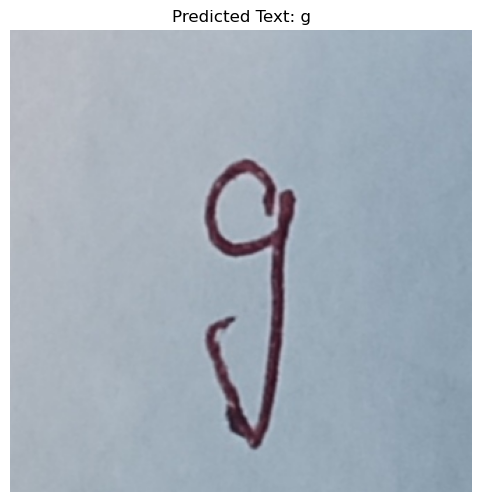

In [21]:
import cv2
import matplotlib.pyplot as plt

# Load the image
image_path = '/Users/abalakrishnareddy/Desktop/Deep_Learning/Handwriting_Dataset/Small/g/IMG_20231016_124920 - BALAKRISHNA REDDY A 2021-CSEUG.jpg'  # Replace with the path to your image
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Preprocess the image
image = cv2.resize(image, (128, 128))  # Resize to the model input size
image = image / 255.0  # Normalize the image

# Reshape the image to match the model input shape
image = image.reshape(1, 128, 128, 1)

# Predict the text
predicted_text = model.predict(image)  # You already have this code to predict the text

# Convert the predicted label to text using the label dictionary
predicted_text_label = reverse_dict[predicted_text.argmax()]

# Display the image with the predicted text
plt.figure(figsize=(6, 6))
plt.imshow(cv2.imread(image_path))
plt.title(f"Predicted Text: {predicted_text_label}")
plt.axis('off')
plt.show()

In [20]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load your pre-trained model
model = load_model('Dl_Model1')

# Function to preprocess and predict individual characters
def predict_characters(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    if image is not None and not image.size == 0:
        # Preprocess the image (resize and normalize)
        image = cv2.resize(image, (128, 128))
        image = image / 255.0
        image = image[np.newaxis, :, :, np.newaxis]

        # Use the model to predict characters
        predictions = model.predict(image)
        
        # Post-process the predictions
        character_list = [chr(65 + np.argmax(char_pred)) for char_pred in predictions[0]]

        # Concatenate the characters into a word
        word = ''.join(character_list)

        return word
    else:
        return None

# Example usage
image_path = '/Users/abalakrishnareddy/Desktop/Deep_Learning/Handwriting_Dataset/Small/g/IMG_20231016_124920 - BALAKRISHNA REDDY A 2021-CSEUG.jpg'
predicted_word = predict_characters(image_path)

if predicted_word:
    print(f'Predicted Word: {predicted_word}')
else:
    print('No valid image found.')


1/1 [==============================] - 0s 249ms/step
Predicted Word: a


1/1 [==============================] - 0s 403ms/step


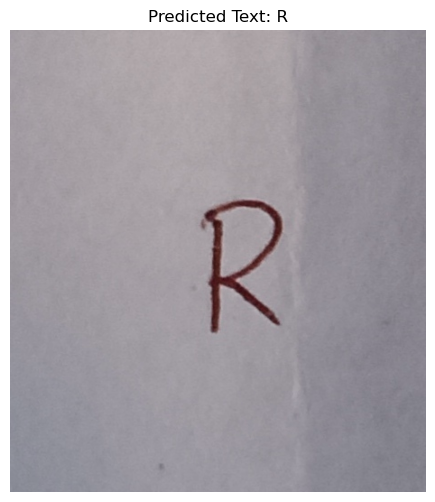

1/1 [==============================] - 0s 23ms/step


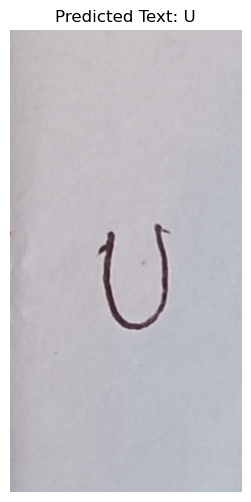

1/1 [==============================] - 0s 21ms/step


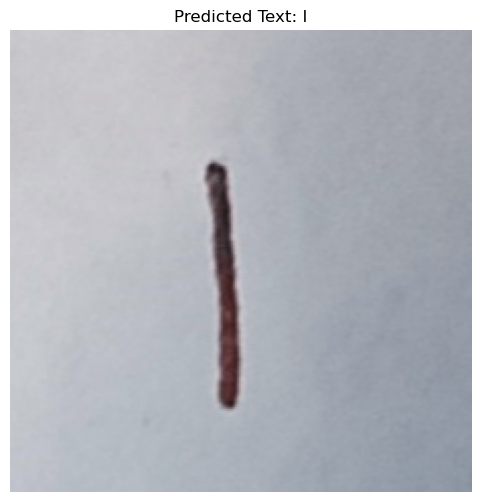

1/1 [==============================] - 0s 22ms/step


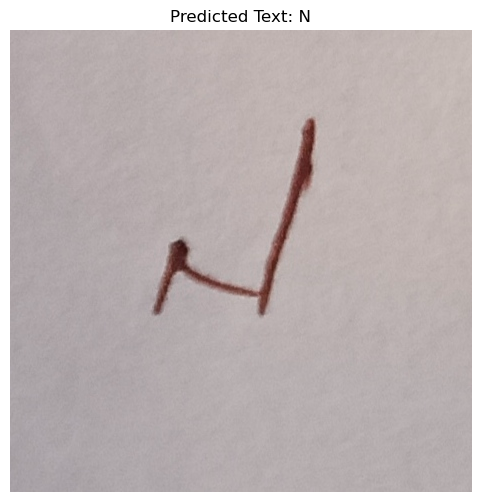

1/1 [==============================] - 0s 35ms/step


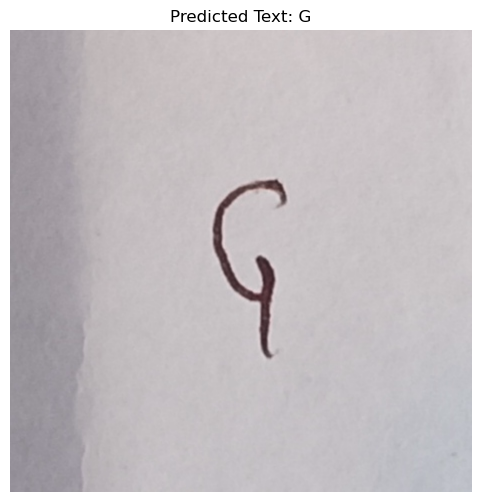

1/1 [==============================] - 0s 28ms/step


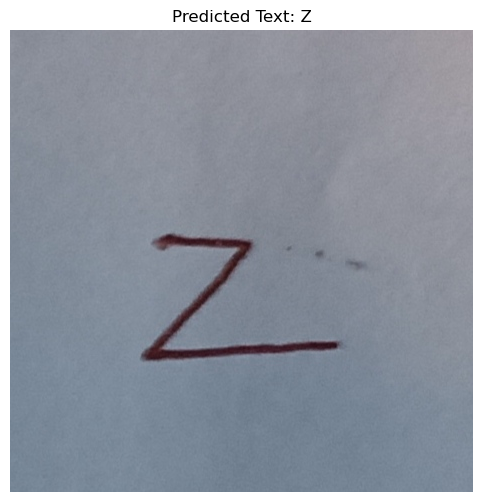

1/1 [==============================] - 0s 31ms/step


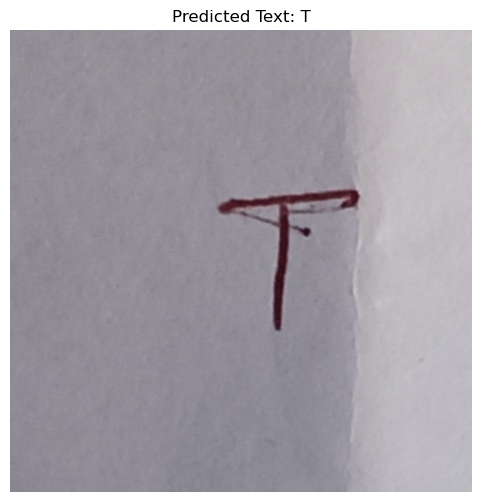

1/1 [==============================] - 0s 20ms/step


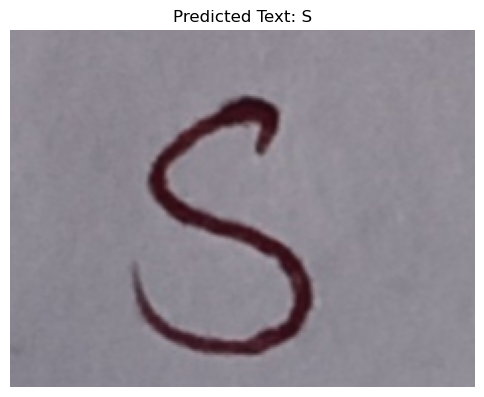

1/1 [==============================] - 0s 22ms/step


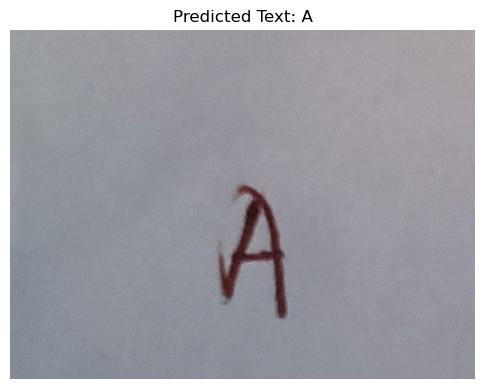

1/1 [==============================] - 0s 20ms/step


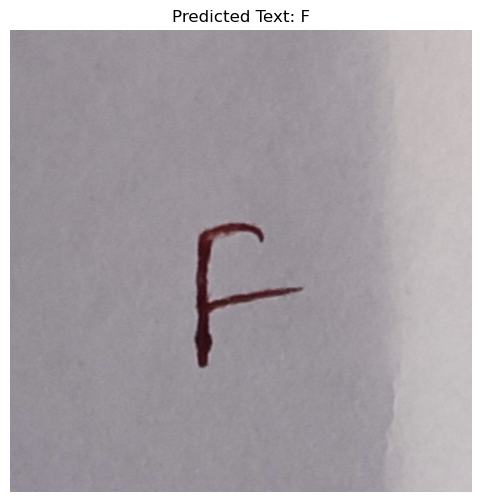

1/1 [==============================] - 0s 19ms/step


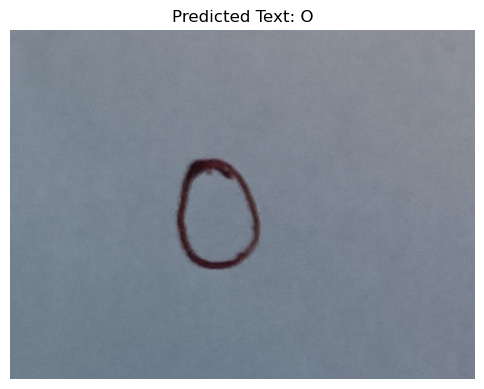

1/1 [==============================] - 0s 23ms/step


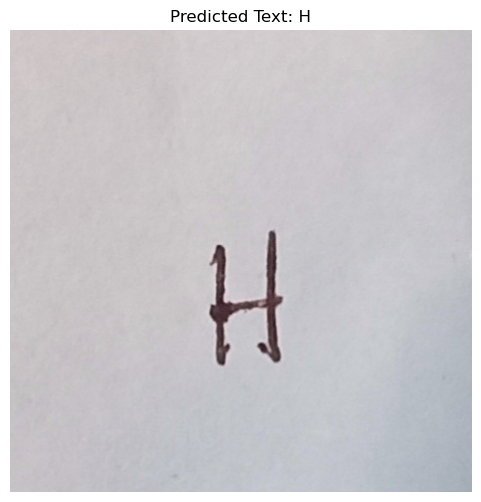

1/1 [==============================] - 0s 20ms/step


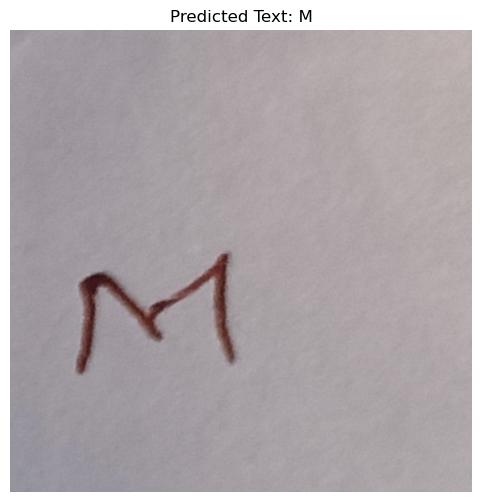

1/1 [==============================] - 0s 20ms/step


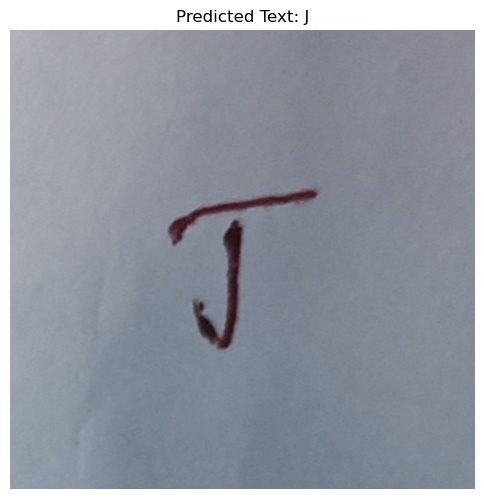

1/1 [==============================] - 0s 20ms/step


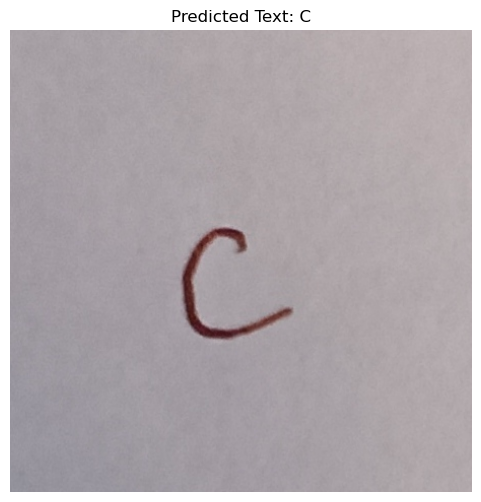

1/1 [==============================] - 0s 22ms/step


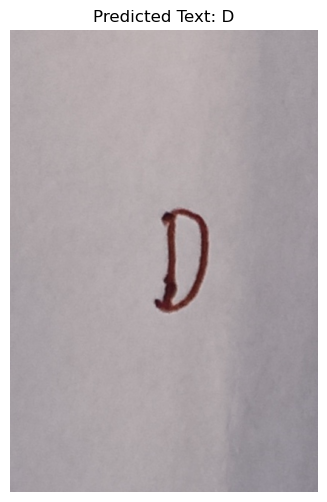

1/1 [==============================] - 0s 22ms/step


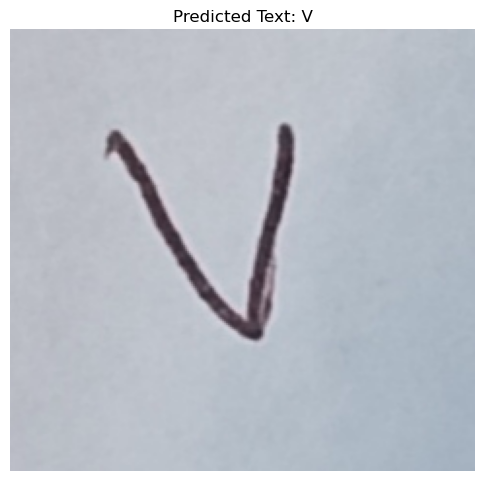

1/1 [==============================] - 0s 20ms/step


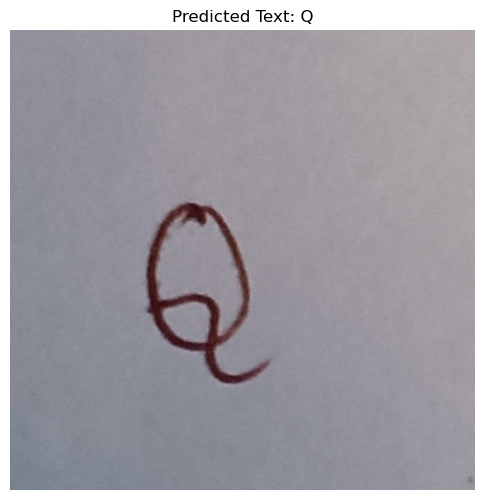

1/1 [==============================] - 0s 20ms/step


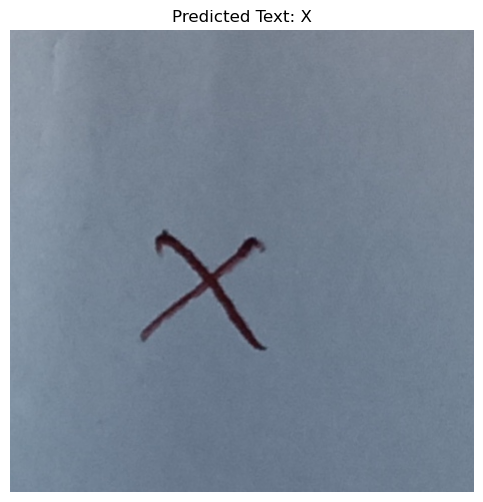

1/1 [==============================] - 0s 23ms/step


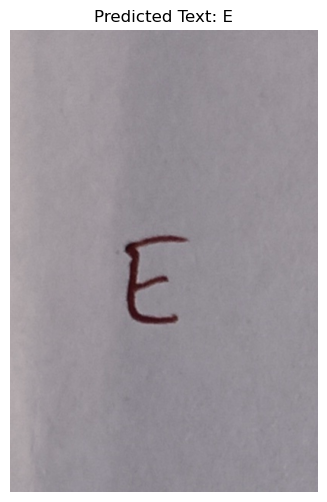

1/1 [==============================] - 0s 21ms/step


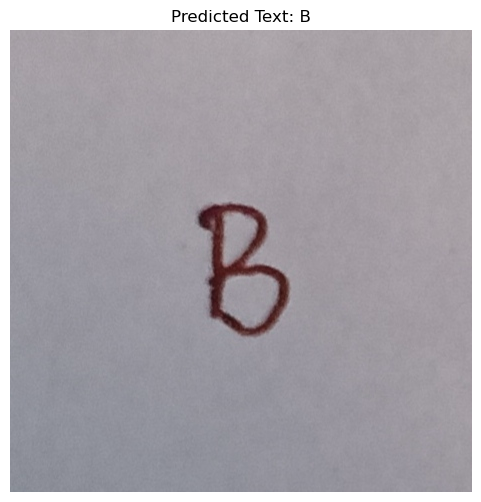

1/1 [==============================] - 0s 27ms/step


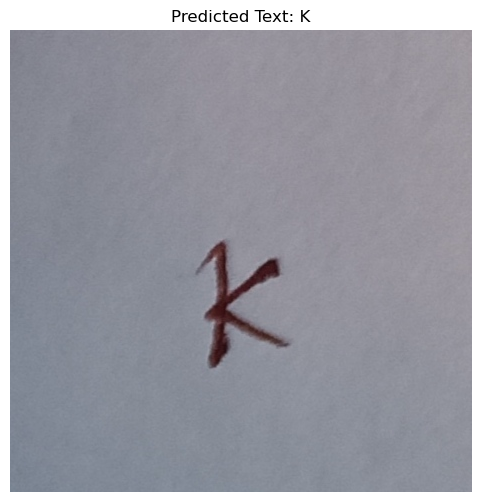

1/1 [==============================] - 0s 24ms/step


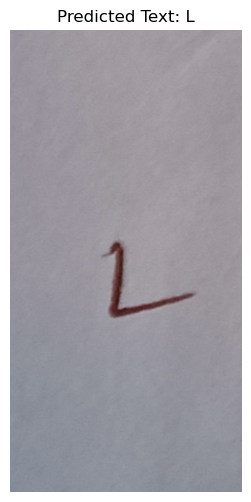

1/1 [==============================] - 0s 21ms/step


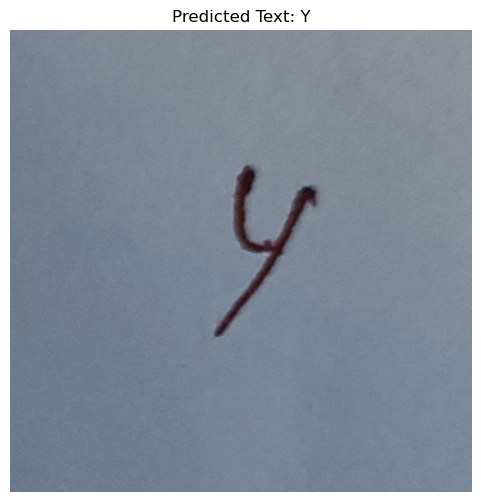

1/1 [==============================] - 0s 24ms/step


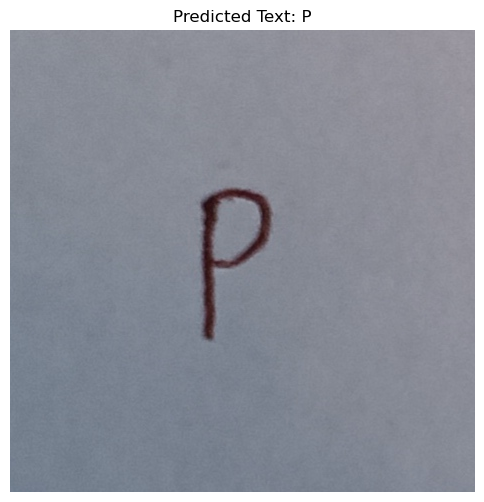

1/1 [==============================] - 0s 20ms/step


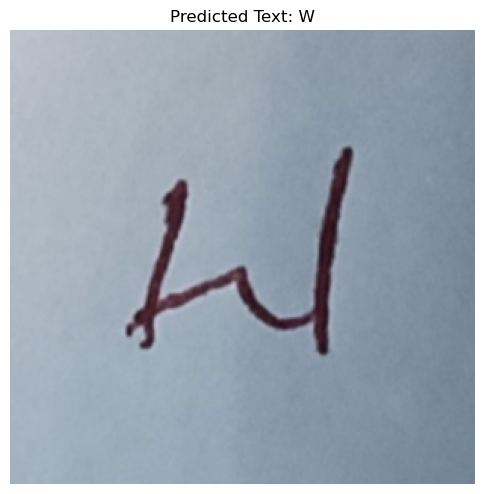

1/1 [==============================] - 0s 24ms/step


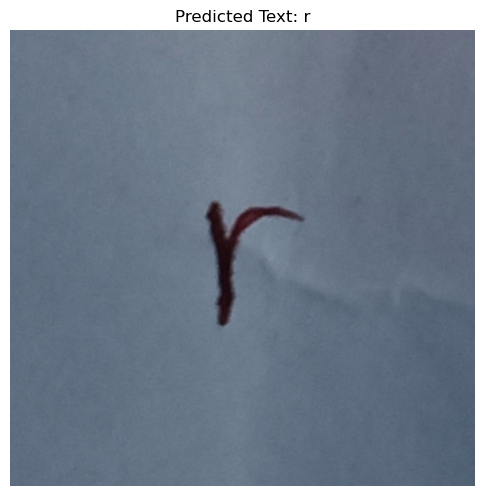

1/1 [==============================] - 0s 23ms/step


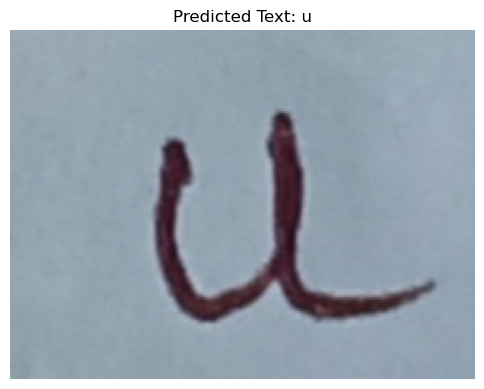

1/1 [==============================] - 0s 20ms/step


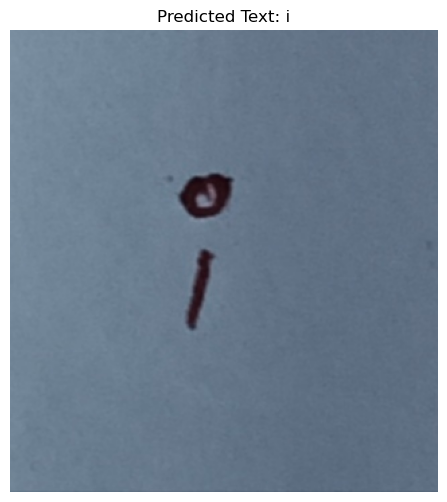

1/1 [==============================] - 0s 26ms/step


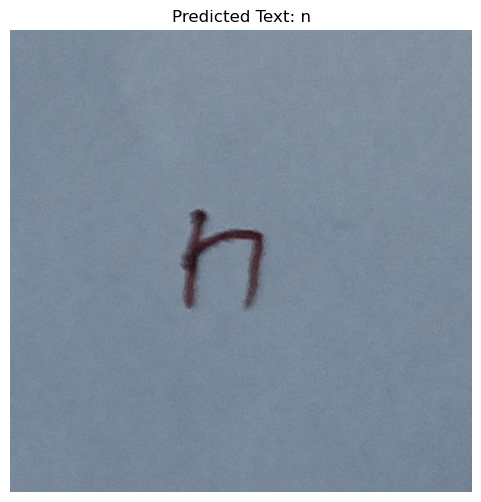

1/1 [==============================] - 0s 28ms/step


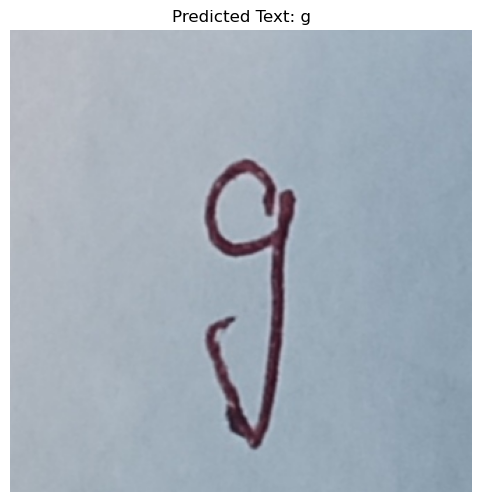

1/1 [==============================] - 0s 20ms/step


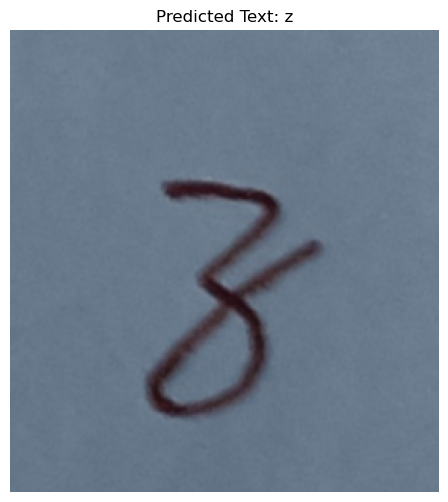

1/1 [==============================] - 0s 20ms/step


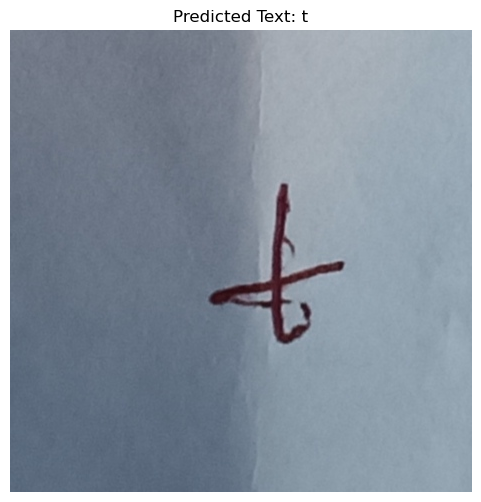

1/1 [==============================] - 0s 23ms/step


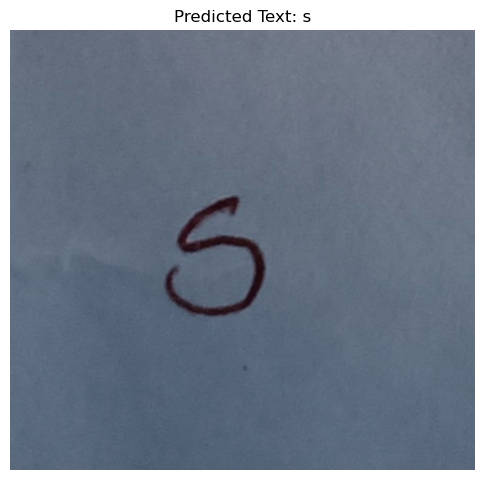

1/1 [==============================] - 0s 22ms/step


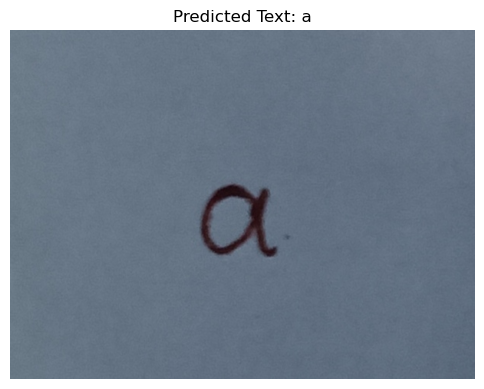

1/1 [==============================] - 0s 19ms/step


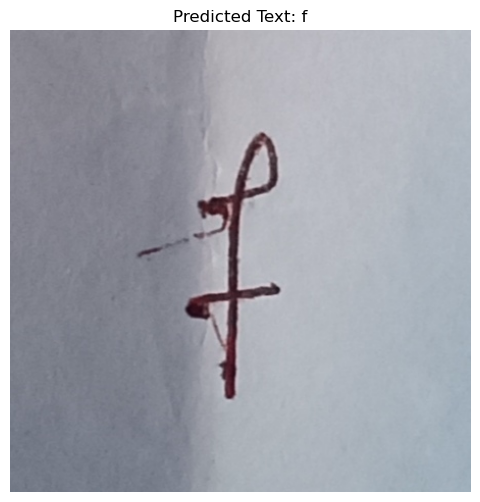

1/1 [==============================] - 0s 23ms/step


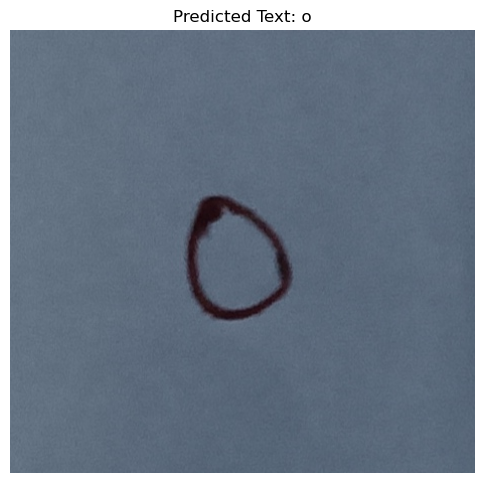

1/1 [==============================] - 0s 24ms/step


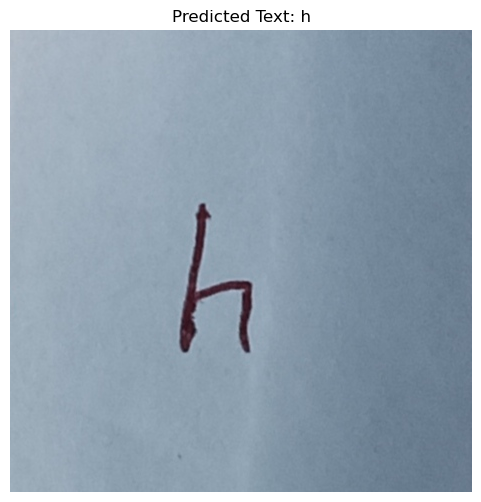

1/1 [==============================] - 0s 20ms/step


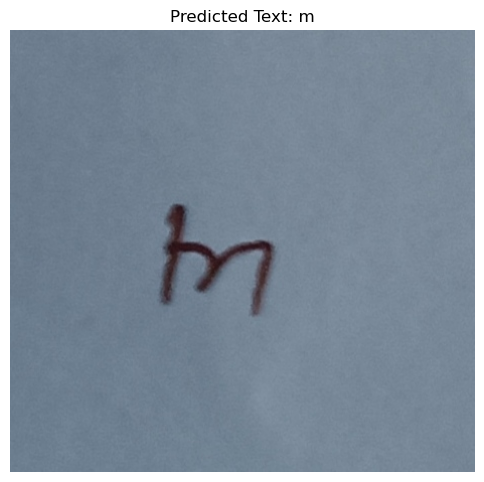

1/1 [==============================] - 0s 23ms/step


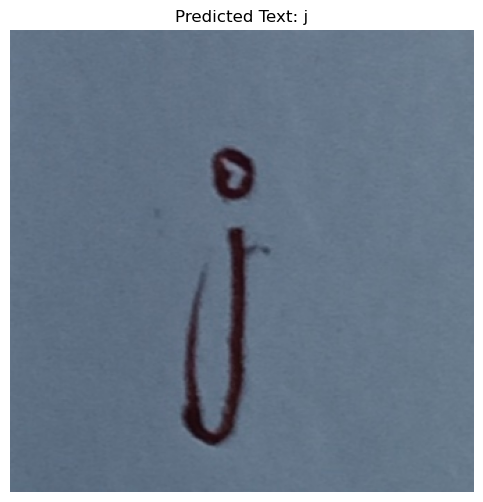

1/1 [==============================] - 0s 22ms/step


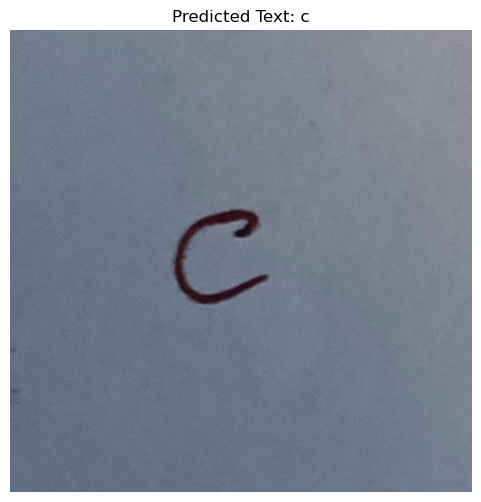

1/1 [==============================] - 0s 22ms/step


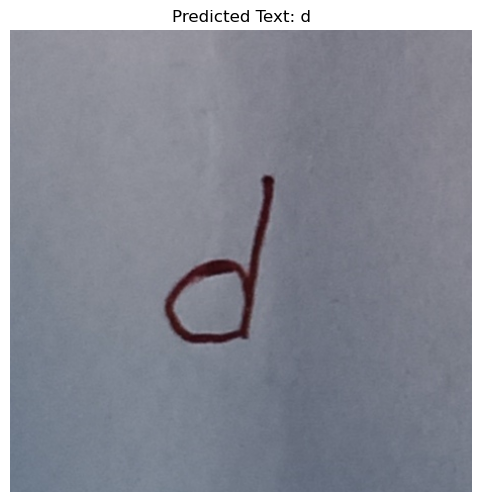

1/1 [==============================] - 0s 21ms/step


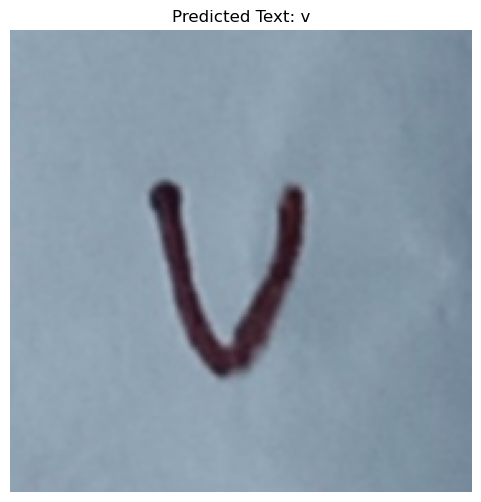

1/1 [==============================] - 0s 22ms/step


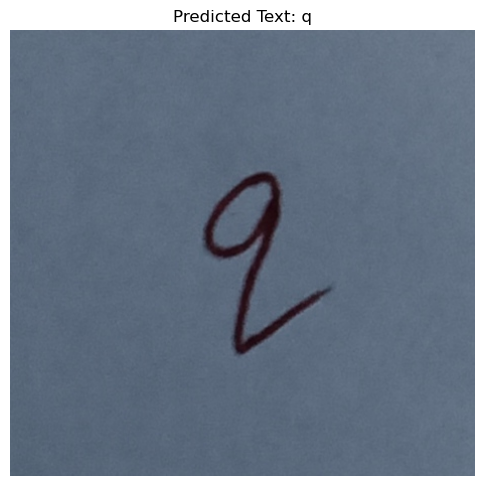

1/1 [==============================] - 0s 24ms/step


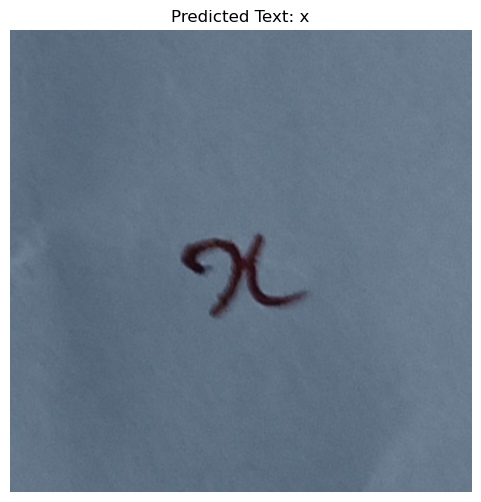

1/1 [==============================] - 0s 22ms/step


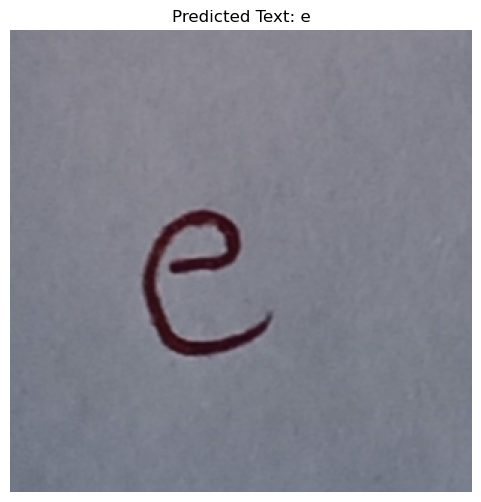

1/1 [==============================] - 0s 22ms/step


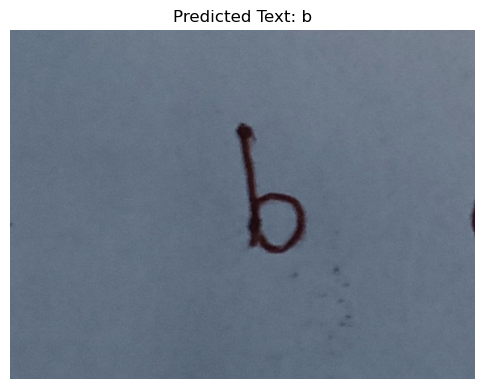

1/1 [==============================] - 0s 21ms/step


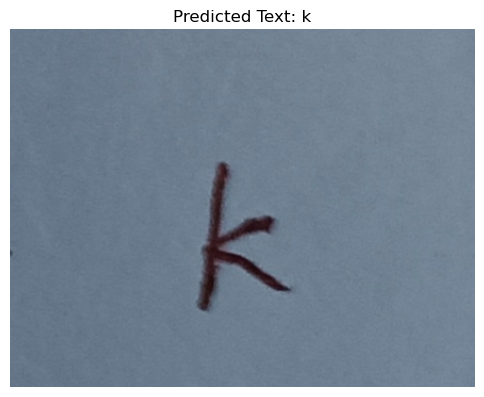

1/1 [==============================] - 0s 22ms/step


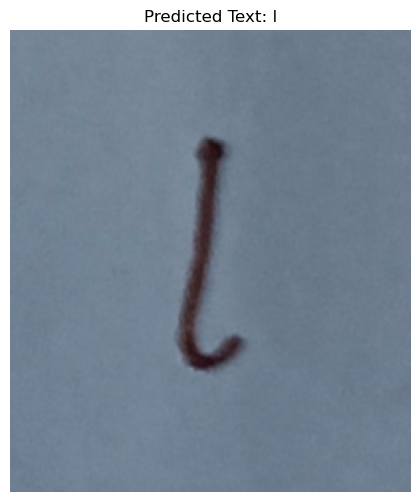

1/1 [==============================] - 0s 21ms/step


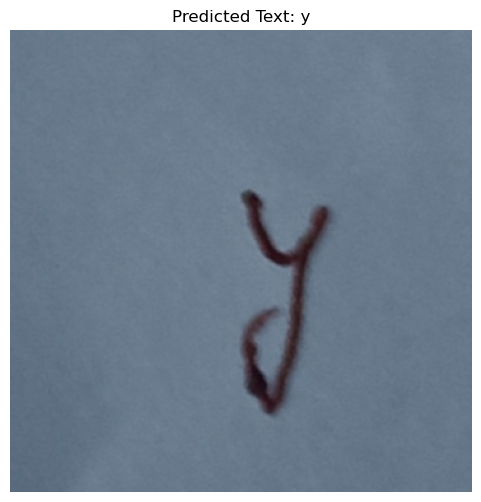

1/1 [==============================] - 0s 20ms/step


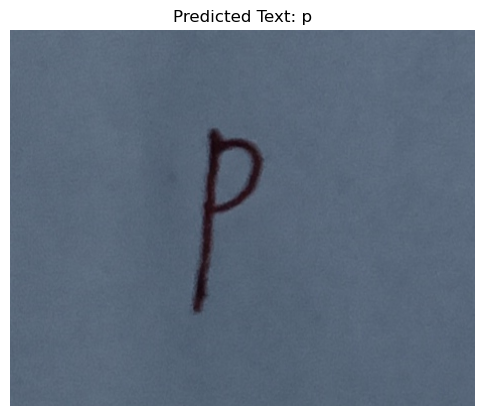

1/1 [==============================] - 0s 19ms/step


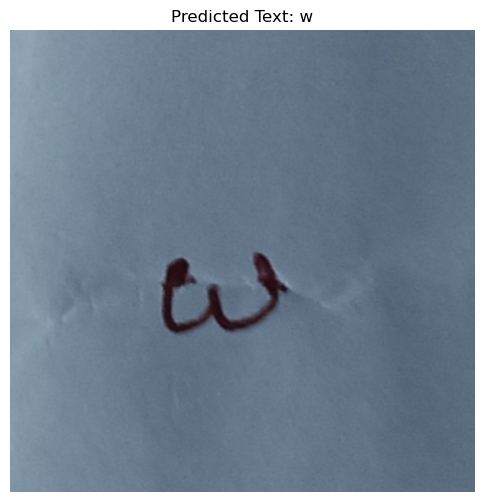

1/1 [==============================] - 0s 20ms/step


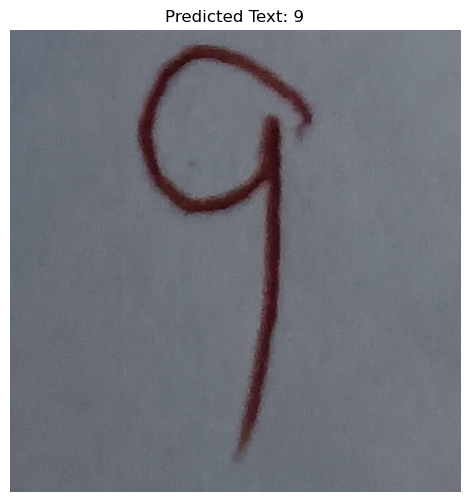

1/1 [==============================] - 0s 20ms/step


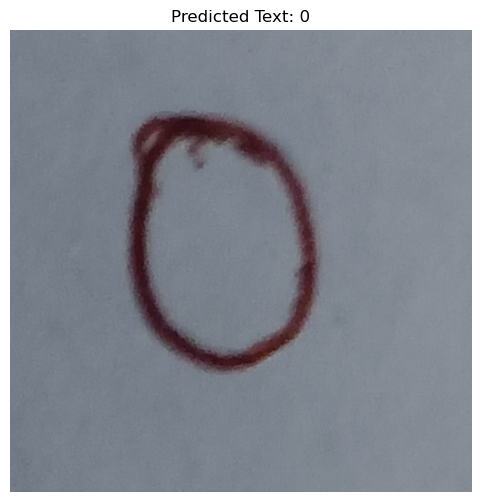

1/1 [==============================] - 0s 20ms/step


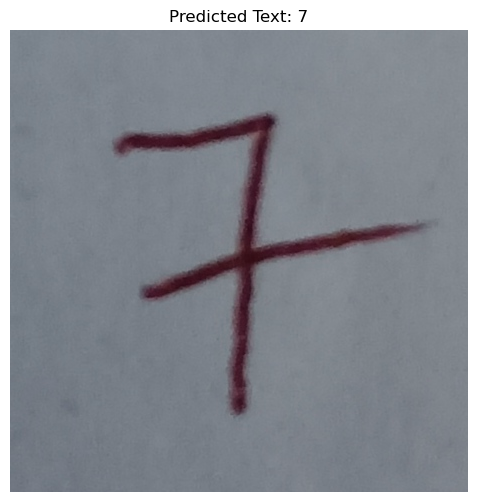

1/1 [==============================] - 0s 21ms/step


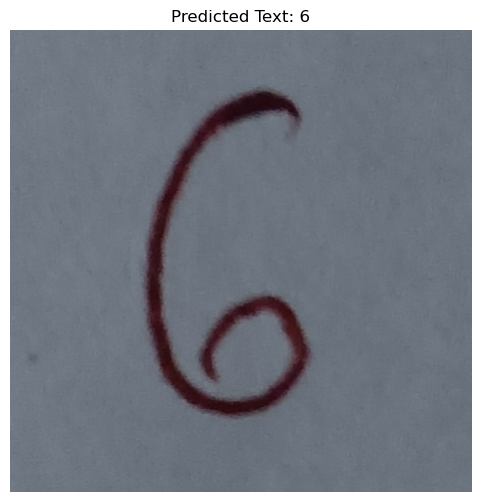

1/1 [==============================] - 0s 20ms/step


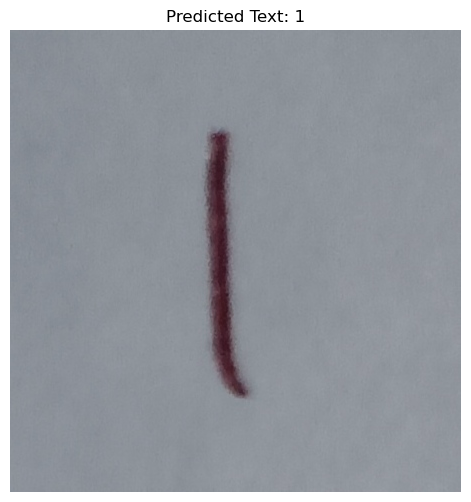

1/1 [==============================] - 0s 19ms/step


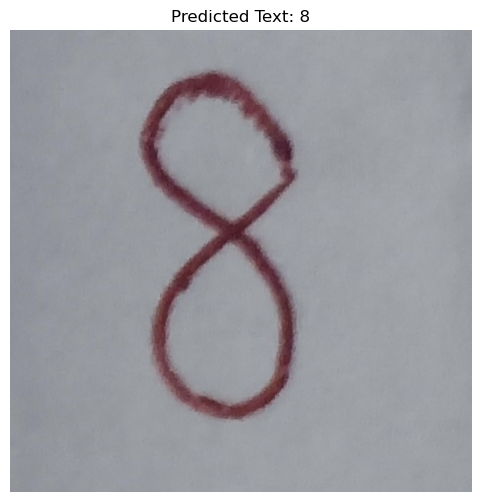

1/1 [==============================] - 0s 20ms/step


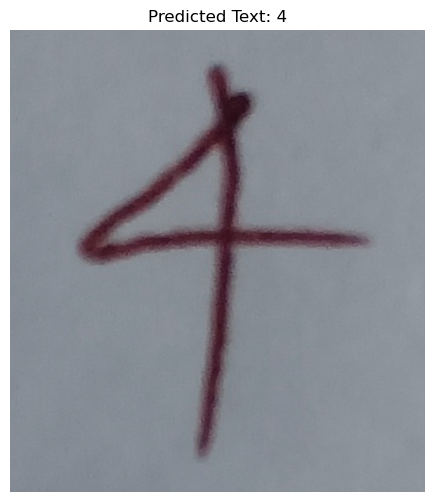

1/1 [==============================] - 0s 21ms/step


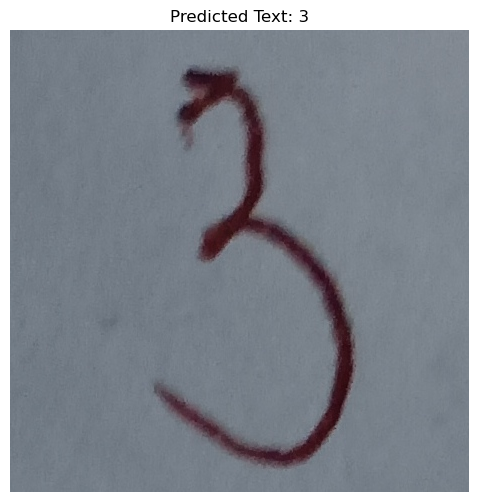

1/1 [==============================] - 0s 30ms/step


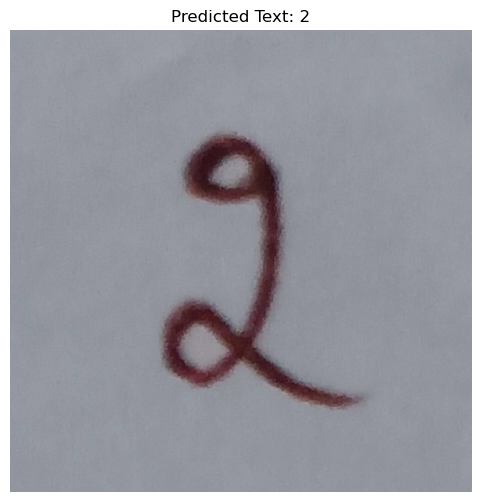

1/1 [==============================] - 0s 30ms/step


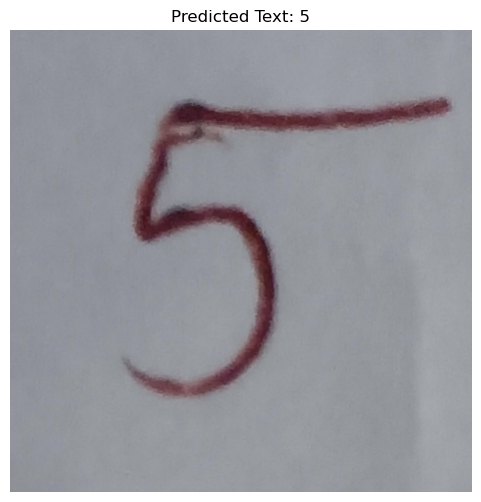

In [17]:
import os

directory = "/Users/abalakrishnareddy/Desktop/Deep_Learning/Handwriting_Dataset"

for subfolder_name in ['Capital', 'Small', 'Number']:
    subfolder_path = os.path.join(directory, subfolder_name)
    if os.path.isdir(subfolder_path):
        for subclass_name in os.listdir(subfolder_path):
            subclass_path = os.path.join(subfolder_path, subclass_name)
            if os.path.isdir(subclass_path):
                label = subclass_name
                for filename in os.listdir(subclass_path):
                    if filename.endswith(('.jpg', '.jpeg', '.png')):
                        image_path = os.path.join(subclass_path, filename)
                        lesgo(image_path)
